Analysis for section Comparison of Core Climate Variables over Canada

In [1]:
import os
from pathlib import Path

if 'ESMFMKFILE' not in os.environ:
    os.environ['ESMFMKFILE'] = str(Path(os.__file__).parent.parent / 'esmf.mk')
import figanos.matplotlib as sp

In [2]:

import xarray as xr
from matplotlib import pyplot as plt
import glob
from xscen.config import CONFIG, load_config
import cartopy.crs as ccrs
import pandas as pd
import xclim as xc
#import spirograph.matplotlib as sp
import string
from dask.distributed import Client


import xscen as xs
from dask.diagnostics import ProgressBar

load_config('paths_pc.yml', verbose=(__name__ == '__main__'), reset=True)
tdd={'xarray_open_kwargs':{'decode_timedelta': False}}
pd.set_option('display.max_columns', None)
sp.utils.set_mpl_style('ouranos')

cbar= {'tg_mean': 'plasma',
       'tx_mean': 'plasma',
       'tn_mean': 'plasma',
       'prcptot': 'viridis_r'
      }

cbar_bias= {'tg_mean': 'temp_div',
       'tx_mean': 'temp_div',
       'tn_mean': 'temp_div',
       'prcptot': 'prec_div'
      }
time_name= {'AS-JAN':{'1': 'annual'},
           'QS-DEC':{'3':'MAM',
                     '6':'JJA',
                     '9':'SON',
                     '12':'DEC'}}

var2name={'prcptot':r'$\tt{pr}$', 'tx_mean':r'$\tt{tasmax}$', 'tn_mean':r'$\tt{tasmin}$'}


map_proj = ccrs.LambertConformal(central_longitude=-95, central_latitude=45)


INFO:xscen.config:Updated the config with paths_pc.yml.


# Load project catalog

In [3]:
project={'name': 'platform-comparison',
 'version': '1.0.0',
 'description': "Comparing canadian climate platform",
 'id': 'pc'}
pcat_espo = xs.ProjectCatalog(CONFIG['paths']['pcat_espo'])
pcat = xs.ProjectCatalog(CONFIG['paths']['project_catalog'])
pcat.df


,id,type,processing_level,bias_adjust_institution,bias_adjust_project,mip_era,activity,driving_institution,driving_model,institution,source,experiment,member,xrfreq,frequency,variable,domain,date_start,date_end,version,format,path
0,climatedata_CMIP6_ScenarioMIP_ssp126_CAN-PCIC,simulation,ensemble-30ymean,PCIC,climatedata,CMIP6,ScenarioMIP,NaN,NaN,NaN,NaN,ssp126,NaN,MS,mon,"(r20mm_delta_1971_2000_p10, r20mm_delta_1971_2...",CAN-PCIC,1950-01-01,2100-12-31 23:00:00,NaN,nc,/tank/jlavoie/ccdp/output/final/r20mm/MS/ssp12...
1,climatedata_CMIP6_ScenarioMIP_ssp585_CAN-PCIC,simulation,ensemble-30ymean,PCIC,climatedata,CMIP6,ScenarioMIP,NaN,NaN,NaN,NaN,ssp585,NaN,MS,mon,"(r20mm_delta_1971_2000_p10, r20mm_delta_1971_2...",CAN-PCIC,1950-01-01,2100-12-31 23:00:00,NaN,nc,/tank/jlavoie/ccdp/output/final/r20mm/MS/ssp58...
2,climatedata_CMIP6_ScenarioMIP_ssp245_CAN-PCIC,simulation,ensemble-30ymean,PCIC,climatedata,CMIP6,ScenarioMIP,NaN,NaN,NaN,NaN,ssp245,NaN,MS,mon,"(r20mm_delta_1971_2000_p10, r20mm_delta_1971_2...",CAN-PCIC,1950-01-01,2100-12-31 23:00:00,NaN,nc,/tank/jlavoie/ccdp/output/final/r20mm/MS/ssp24...
3,climatedata_CMIP6_ScenarioMIP_ssp126_CAN-PCIC,simulation,ensemble-30ymean,PCIC,climatedata,CMIP6,ScenarioMIP,NaN,NaN,NaN,NaN,ssp126,NaN,QS-DEC,qtr,"(r20mm_delta_1971_2000_p10, r20mm_delta_1971_2...",CAN-PCIC,1950-01-01,2100-12-31 23:00:00,NaN,nc,/tank/jlavoie/ccdp/output/final/r20mm/QS-DEC/s...
4,climatedata_CMIP6_ScenarioMIP_ssp585_CAN-PCIC,simulation,ensemble-30ymean,PCIC,climatedata,CMIP6,ScenarioMIP,NaN,NaN,NaN,NaN,ssp585,NaN,QS-DEC,qtr,"(r20mm_delta_1971_2000_p10, r20mm_delta_1971_2...",CAN-PCIC,1950-01-01,2100-12-31 23:00:00,NaN,nc,/tank/jlavoie/ccdp/output/final/r20mm/QS-DEC/s...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6612,CanDCS-U5_CMIP5_ScenarioMIP_bcc-csm1-1_rcp85_r...,simulation,indicators,PCIC,CanDCS-U5,CMIP5,ScenarioMIP,NaN,NaN,NaN,bcc-csm1-1,rcp85,r1i1p1,AS-JAN,yr,"(tn_mean,)",CAN-PCIC,1950-01-01,2100-01-01 00:00:00,NaN,zarr,/jarre/scenario/jlavoie/plat-comp/indicators/C...
6613,CanDCS-U5_CMIP5_ScenarioMIP_bcc-csm1-1_rcp45_r...,simulation,indicators,PCIC,CanDCS-U5,CMIP5,ScenarioMIP,NaN,NaN,NaN,bcc-csm1-1,rcp45,r1i1p1,AS-JAN,yr,"(prcptot,)",CAN-PCIC,1950-01-01,2100-01-01 00:00:00,NaN,zarr,/jarre/scenario/jlavoie/plat-comp/indicators/C...
6614,CanDCS-U5_CMIP5_ScenarioMIP_bcc-csm1-1_rcp45_r...,simulation,indicators,PCIC,CanDCS-U5,CMIP5,ScenarioMIP,NaN,NaN,NaN,bcc-csm1-1,rcp45,r1i1p1,AS-JAN,yr,"(tx_mean,)",CAN-PCIC,1950-01-01,2100-01-01 00:00:00,NaN,zarr,/jarre/scenario/jlavoie/plat-comp/indicators/C...
6615,CanDCS-U5_CMIP5_ScenarioMIP_bcc-csm1-1_rcp45_r...,simulation,indicators,PCIC,CanDCS-U5,CMIP5,ScenarioMIP,NaN,NaN,NaN,bcc-csm1-1,rcp45,r1i1p1,AS-JAN,yr,"(tn_mean,)",CAN-PCIC,1950-01-01,2100-01-01 00:00:00,NaN,zarr,/jarre/scenario/jlavoie/plat-comp/indicators/C...


# climatology

Moderate Emissions
prcptot 6061.832 -787.4553 164.28004 190.2276
prcptot [162.45456266]
tx_mean 3.6019802 -12.450953 -0.7019643 1.3626461
tx_mean [-0.75733771]
tn_mean 5.7577662 -13.931704 -0.33037814 1.7984495
tn_mean [-0.19465658]
prcptot 6745.683 -825.6974 175.532 209.46916
prcptot [172.51313852]
tx_mean 3.0308313 -12.789555 -1.1207731 1.3724451
tx_mean [-1.14689224]
tn_mean 5.332758 -14.140579 -0.7025398 1.8200674
tn_mean [-0.53120684]
High Emissions
prcptot 6881.3247 -915.11975 159.74106 212.82071
prcptot [156.37420718]
tx_mean 1.9138331 -14.485905 -2.6797113 1.3437121
tx_mean [-2.63103204]
tn_mean 4.0343227 -15.323456 -2.2147481 1.8952451
tn_mean [-1.96126279]


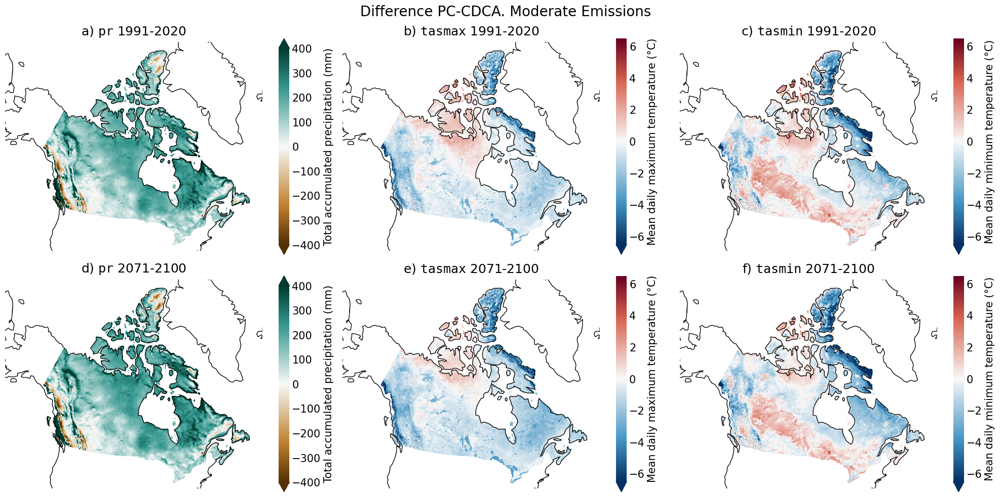

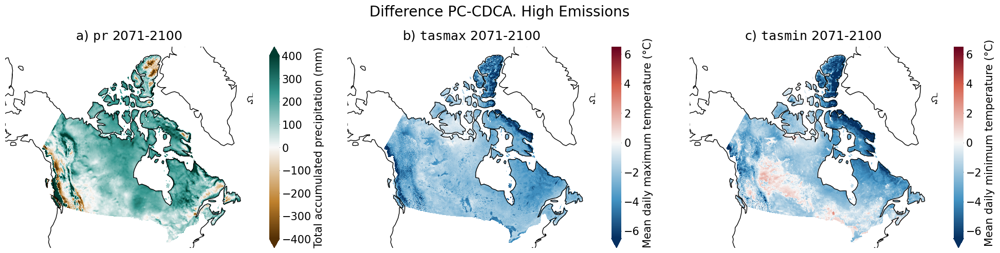

In [4]:
#*diff CD and PC climatology

for exp_pcic, exp_espo, exp_title in zip(['ssp245','ssp585'],['ssp245','ssp370'],
                                         ['Moderate Emissions','High Emissions']):
    print(exp_title)
    
    fig,axs = plt.subplots(2 if exp_title == 'Moderate Emissions' else 1,
                           3,
                           figsize=(20,10) if exp_title == 'Moderate Emissions' else (20,5),
                           subplot_kw={"projection": map_proj})

    horizons=['1991-2020','2071-2100'] if exp_title == 'Moderate Emissions' else ['2071-2100']
    for j,horizon in enumerate(horizons):
        year = horizon.split('-')[0]
        for i,var in enumerate(['prcptot', 'tx_mean', 'tn_mean']):

            for xrfreq in ['AS-JAN']:

                variables= [f"{var}_{p}" for p in ['p10','p50','p90']]



                #pcic ensemble
                ens_pcic = pcat.search(xrfreq=xrfreq,
                                       variable=variables,
                                       bias_adjust_project='climatedata',
                                       processing_level='ensemble-30ymean',
                                       domain='CAN-PCIC',
                                       experiment=exp_pcic).to_dask(**tdd).sel(time=year)

                #espo ensemble
                ens_espo = pcat.search(xrfreq=xrfreq,
                                       variable=variables,
                                       bias_adjust_project='ESPO-G6-R2',
                                       processing_level='ensemble-climatology',
                                       domain='CAN-PCIC',
                                       experiment=exp_espo).to_dask(**tdd).sel(time=year)


                #selection
                cur_pcic = ens_pcic[f'{var}_p50']
                cur_espo = ens_espo[f'{var}_p50']



                with xr.set_options(keep_attrs=True):
                    if var =='prcptot':
                        diff = cur_espo - cur_pcic
                        plot_kw={'vmin':-400, 'vmax':400}
                    else:
                        cur_espo= xc.units.convert_units_to(cur_espo, 'degC')
                        cur_pcic= xc.units.convert_units_to(cur_pcic, 'degC')
                        diff = (cur_espo - cur_pcic)
                        plot_kw={'vmin':-6.5, 'vmax':6.5}

                #print(var, diff.max().values, diff.min().values, diff.mean().values, diff.std().values)
                #print(var, xs.spatial_mean(diff.to_dataset(), method='cos-lat')[f'{var}_p50'].values)
                
                ax=axs[j,i] if exp_title == 'Moderate Emissions' else axs[i]
                
                sp.gridmap(diff.squeeze(), ax=ax, divergent=0, features=['coastline'], plot_kw=plot_kw)

                ax.set_title(f'{string.ascii_lowercase[i+(3*j)]}) {var2name[var]} {horizon}', fontsize=18)
                ax.collections[-1].colorbar.outline.set_visible(False)
                ax.collections[-1].colorbar.set_label(
                    f"{diff.attrs['long_name']} ({diff.attrs['units']})".replace('30-year mean of ',''), fontsize=15)
                ax.collections[-1].colorbar.ax.tick_params(labelsize=15)


            fig.tight_layout()
            fig.suptitle(f' Difference PC-CDCA. {exp_title}', fontsize=20)
    name_fig= 'mod' if exp_pcic=='ssp245' else 'high'
    plt.savefig(f"{CONFIG['paths']['figures']}diff_{name_fig}_clim.pdf", bbox_inches='tight')

Moderate Emissions
prcptot 2434.2075 -339.76157 30.821428 56.992264
tx_mean 7.536022 -19.556465 -0.70183164 2.0389647
tn_mean 10.405716 -15.516621 -0.33738947 2.300836


ERROR:fiona._env:PROJ: proj_identify: Cannot find proj.db


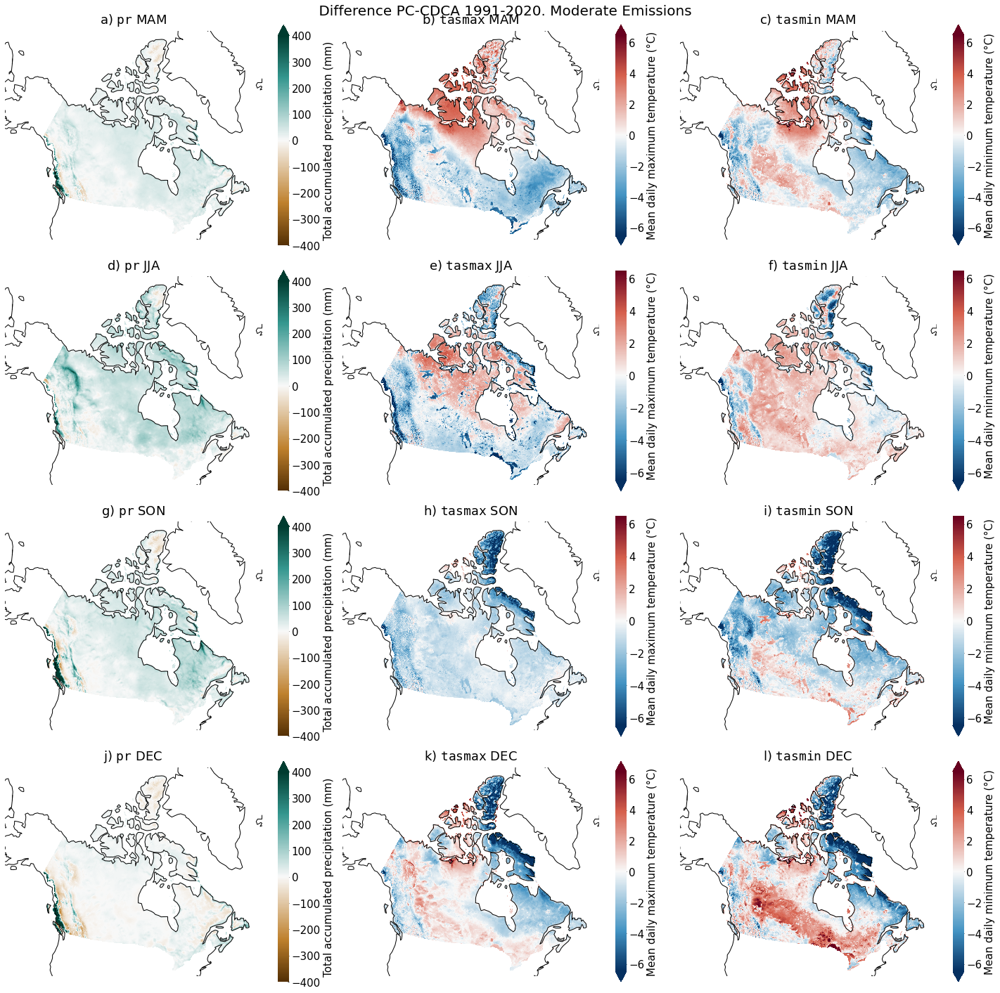

In [5]:
#*diff CD and PC climatology

for exp_pcic, exp_espo, exp_title in zip(['ssp245'],['ssp245'],
                                         ['Moderate Emissions']):
    print(exp_title)
    fig,axs = plt.subplots(4,3, figsize=(20,20),subplot_kw={"projection": map_proj})


    for k,horizon in enumerate(['1991-2020']):
        year = horizon.split('-')[0]
        for i,var in enumerate(['prcptot', 'tx_mean', 'tn_mean']):

            for xrfreq in ['QS-DEC']:

                variables= [f"{var}_{p}" for p in ['p10','p50','p90']]



                #pcic ensemble
                ens_pcic = pcat.search(xrfreq=xrfreq,
                                       variable=variables,
                                       bias_adjust_project='climatedata',
                                       processing_level='ensemble-30ymean',
                                       domain='CAN-PCIC',
                                       experiment=exp_pcic).to_dask(**tdd).sel(time=year)

                #espo ensemble
                ens_espo = pcat.search(xrfreq=xrfreq,
                                       variable=variables,
                                       bias_adjust_project='ESPO-G6-R2',
                                       processing_level='ensemble-climatology',
                                       domain='CAN-PCIC',
                                       experiment=exp_espo).to_dask(**tdd).sel(time=year)


                #selection
                cur_pcic = ens_pcic[f'{var}_p50']
                cur_espo = ens_espo[f'{var}_p50']



                with xr.set_options(keep_attrs=True):
                    if var =='prcptot':
                        diff = cur_espo - cur_pcic
                        plot_kw={'vmin':-400, 'vmax':400}
                    else:
                        cur_espo= xc.units.convert_units_to(cur_espo, 'degC')
                        cur_pcic= xc.units.convert_units_to(cur_pcic, 'degC')
                        diff = (cur_espo - cur_pcic)
                        plot_kw={'vmin':-6.5, 'vmax':6.5}

                print(var, diff.max().values, diff.min().values, diff.mean().values, diff.std().values)

                for j,(time,season) in enumerate(zip(['1991-03-01', '1991-06-01','1991-09-01', '1991-12-01'],
                                            ['MAM','JJA','SON','DEC'])):
                    sp.gridmap(diff.sel(time=time).squeeze(), ax=axs[j,i], divergent=0, features=['coastline'], plot_kw=plot_kw)

                    axs[j,i].set_title(f'{string.ascii_lowercase[i+(3*j)]}) {var2name[var]} {season} ', fontsize=18)
                    axs[j,i].collections[-1].colorbar.outline.set_visible(False)
                    axs[j,i].collections[-1].colorbar.set_label(
                        f"{diff.attrs['long_name']} ({diff.attrs['units']})".replace('30-year mean of ',''), fontsize=15)
                    axs[j,i].collections[-1].colorbar.ax.tick_params(labelsize=15)


            fig.tight_layout()
            fig.suptitle(f' Difference PC-CDCA {horizon}. {exp_title}', fontsize=20)


# projected change

Moderate Emissions
prcptot espo [72.41135315]
prcptot pcic [61.19558464]
prcptot diff [11.21576851]
tx_mean espo [3.1005505]
tx_mean pcic [3.47623576]
tx_mean diff [-0.37568527]


/exec/jlavoie/.conda/xscen-dev/lib/python3.11/site-packages/figanos/matplotlib/utils.py:789: UserWarning: No spaces, points or colons to break line at.


tn_mean espo [3.45276024]
tn_mean pcic [3.79786239]
tn_mean diff [-0.34510215]


/exec/jlavoie/.conda/xscen-dev/lib/python3.11/site-packages/figanos/matplotlib/utils.py:789: UserWarning: No spaces, points or colons to break line at.


High Emissions
prcptot espo [95.31547368]
prcptot pcic [102.08324647]
prcptot diff [-6.76777279]
tx_mean espo [4.57367599]
tx_mean pcic [6.42257294]
tx_mean diff [-1.84889695]


/exec/jlavoie/.conda/xscen-dev/lib/python3.11/site-packages/figanos/matplotlib/utils.py:789: UserWarning: No spaces, points or colons to break line at.


tn_mean espo [5.1356816]
tn_mean pcic [6.92127792]
tn_mean diff [-1.78559632]


/exec/jlavoie/.conda/xscen-dev/lib/python3.11/site-packages/figanos/matplotlib/utils.py:789: UserWarning: No spaces, points or colons to break line at.


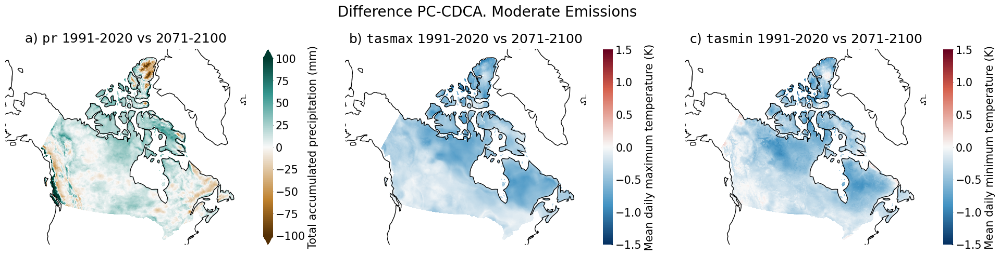

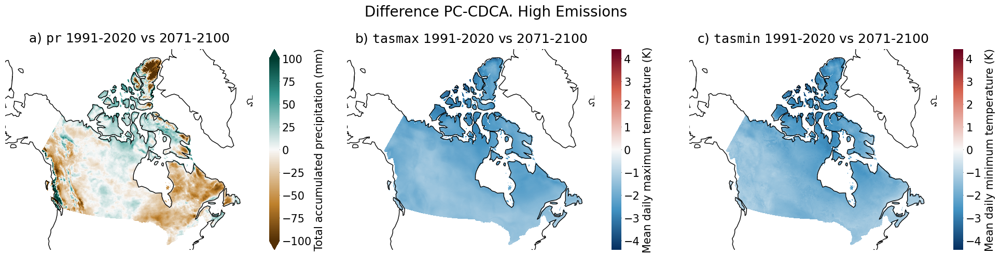

In [4]:
#*diff CD and PC delta
horizon= '2071-2100'
year = horizon.split('-')[0]
for exp_pcic, exp_espo, exp_title in zip(['ssp245','ssp585'],['ssp245','ssp370'],
                                         ['Moderate Emissions','High Emissions']):
    print(exp_title)
    fig,axs = plt.subplots(1,3, figsize=(20,5),subplot_kw={"projection": map_proj})
    for i,var in enumerate(['prcptot', 'tx_mean', 'tn_mean']):
        for xrfreq in ['AS-JAN']:

            variables= [f"{var}_delta_1991_2020_{p}" for p in ['p10','p50','p90']]

            level =  'ensemble-30ymean'
            #pcic ensemble
            ens_pcic = pcat.search(xrfreq=xrfreq,
                                   variable=variables,
                                   bias_adjust_project='climatedata',
                                   processing_level=level,
                                   domain='CAN-PCIC',
                                   experiment=exp_pcic).to_dask(**tdd).sel(time=year)

            #espo ensemble
            level =  'ensemble-abs-delta-1991-2020'
            ens_espo = pcat.search(xrfreq=xrfreq,
                                   variable=variables,
                                   bias_adjust_project='ESPO-G6-R2',
                                   processing_level=level,
                                   domain='CAN-PCIC',
                                   experiment=exp_espo).to_dask(**tdd).sel(time=year)


            #selection
            cur_pcic = ens_pcic[f'{var}_delta_1991_2020_p50']
            cur_espo = ens_espo[f'{var}_delta_1991_2020_p50']
            
            #difference
            with xr.set_options(keep_attrs=True):
                diff = (cur_espo - cur_pcic)
                
            #print(var, 'espo', xs.spatial_mean(cur_espo.to_dataset(), method='cos-lat')[f'{var}_delta_1991_2020_p50'].values)
            #print(var, 'pcic', xs.spatial_mean(cur_pcic.to_dataset(), method='cos-lat')[f'{var}_delta_1991_2020_p50'].values)
            #print(var, 'diff', xs.spatial_mean(diff.to_dataset(), method='cos-lat')[f'{var}_delta_1991_2020_p50'].values)

                
            if var =='prcptot':
                plot_kw= {'vmax':100,'vmin':-100}
            elif exp_espo=='ssp245':
                plot_kw= {'vmax':1.5,'vmin':-1.5}
            else:
                plot_kw= {'vmax':4.4,'vmin':-4.4}
            
            #plot
            sp.gridmap(diff.squeeze(), ax=axs[i], divergent=0, features=['coastline'],plot_kw=plot_kw)
            fig.suptitle(f' Difference PC-CDCA. {exp_title}', fontsize=20)
            axs[i].set_title(f'{string.ascii_lowercase[i]}) {var2name[var]} 1991-2020 vs {horizon}', fontsize=18)
            axs[i].collections[-1].colorbar.outline.set_visible(False)
            axs[i].collections[-1].colorbar.set_label(
                f"{diff.attrs['long_name'].split(':')[0]} ({diff.attrs['units']})".replace('30-year mean of ',''),
                fontsize=15)
            axs[i].collections[-1].colorbar.ax.tick_params(labelsize=15)
            fig.tight_layout()
    name_fig= 'mod' if exp_pcic=='ssp245' else 'high'
    plt.savefig(f"{CONFIG['paths']['figures']}diff_{name_fig}_delta.pdf", bbox_inches='tight')


/exec/jlavoie/.conda/espo-g/lib/python3.9/site-packages/spirograph/matplotlib/utils.py:633: UserWarning: No spaces, points or colons to break line at.
/exec/jlavoie/.conda/espo-g/lib/python3.9/site-packages/spirograph/matplotlib/utils.py:633: UserWarning: No spaces, points or colons to break line at.
/exec/jlavoie/.conda/espo-g/lib/python3.9/site-packages/spirograph/matplotlib/utils.py:633: UserWarning: No spaces, points or colons to break line at.
/exec/jlavoie/.conda/espo-g/lib/python3.9/site-packages/spirograph/matplotlib/utils.py:633: UserWarning: No spaces, points or colons to break line at.
/exec/jlavoie/.conda/espo-g/lib/python3.9/site-packages/spirograph/matplotlib/utils.py:633: UserWarning: No spaces, points or colons to break line at.
/exec/jlavoie/.conda/espo-g/lib/python3.9/site-packages/spirograph/matplotlib/utils.py:633: UserWarning: No spaces, points or colons to break line at.
/exec/jlavoie/.conda/espo-g/lib/python3.9/site-packages/spirograph/matplotlib/utils.py:633: Us

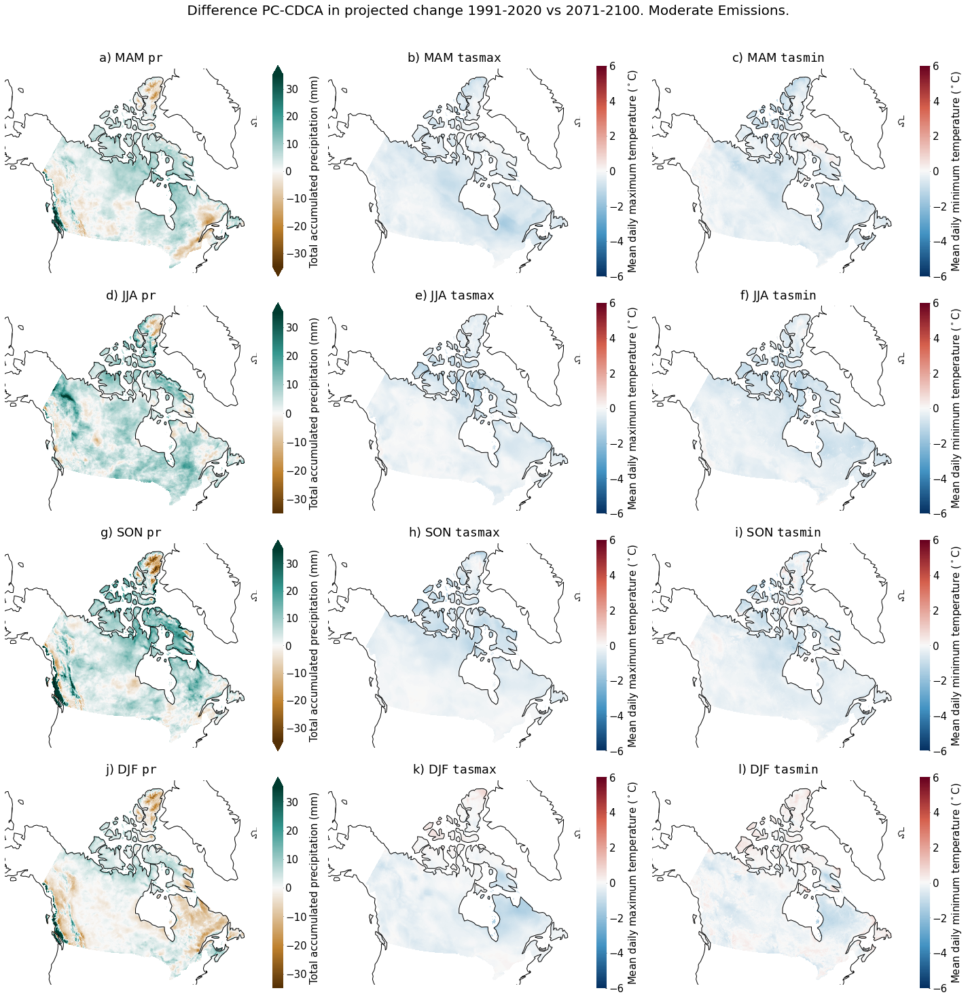

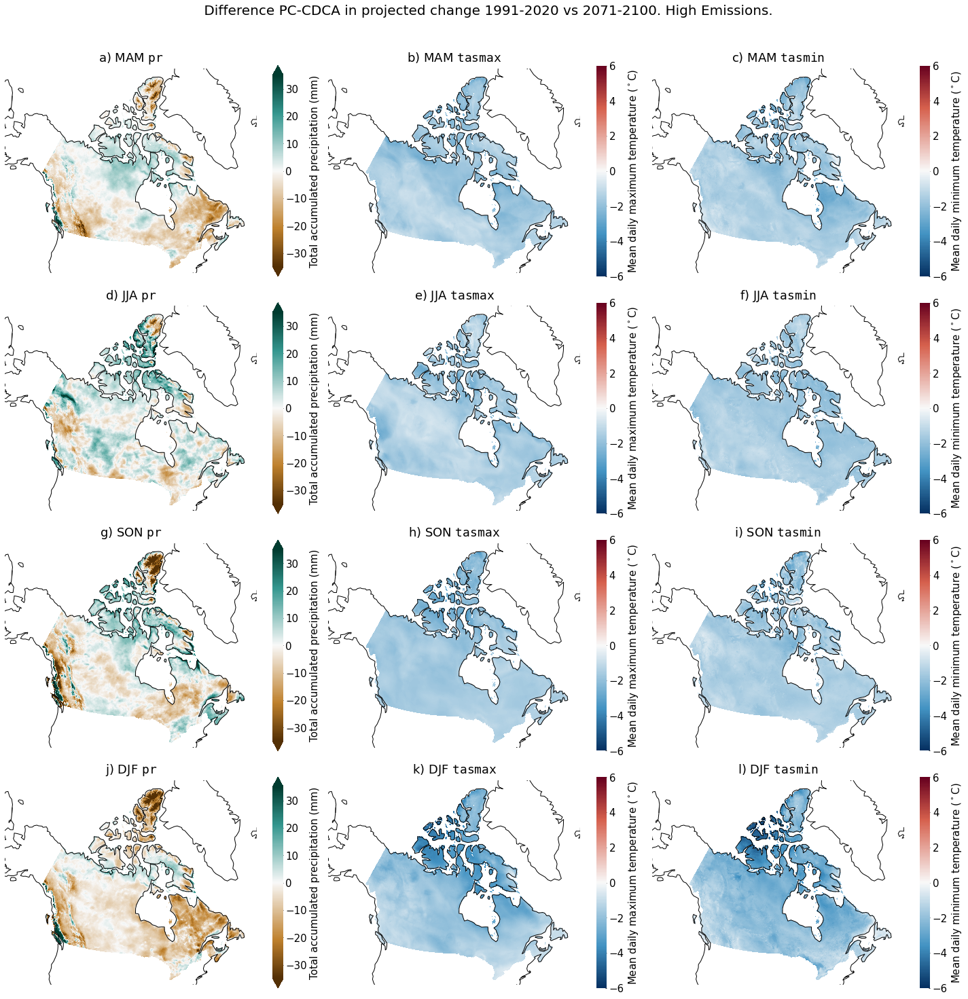

In [8]:
#*diff CD and PC delta seasonal
horizon= '2071-2100'
year = horizon.split('-')[0]
for exp_pcic, exp_espo, exp_title in zip(['ssp245','ssp585'],['ssp245','ssp370'],
                                         ['Moderate Emissions','High Emissions']):
    fig,axs = plt.subplots(4,3, figsize=(20,20),subplot_kw={"projection": map_proj})
    for j,var in enumerate(['prcptot', 'tx_mean', 'tn_mean']):
        for xrfreq in ['QS-DEC']:

            variables= [f"{var}_delta_1991_2020_{p}" for p in ['p10','p50','p90']]

            level =  'ensemble-30ymean'

            #pcic ensemble
            ens_pcic = pcat.search(xrfreq=xrfreq,
                                   variable=variables,
                                   bias_adjust_project='climatedata',
                                   processing_level=level,
                                   domain='CAN-PCIC',
                                   experiment=exp_pcic).to_dask(**tdd)
            ens_pcic = ens_pcic.sel(time=year)

            #espo ensemble
            level =   'ensemble-abs-delta-1991-2020'
            ens_espo = pcat.search(xrfreq=xrfreq,
                                   variable=variables,
                                   bias_adjust_project='ESPO-G6-R2',
                                   processing_level=level,
                                   domain='CAN-PCIC',
                                   experiment=exp_espo).to_dask(**tdd)
            ens_espo = ens_espo.sel(time=year)


            #selection
            cur_pcic = ens_pcic[f'{var}_delta_1991_2020_p50']
            cur_espo = ens_espo[f'{var}_delta_1991_2020_p50']

            with xr.set_options(keep_attrs=True):
                diff = (cur_espo - cur_pcic)

                if var =='prcptot':
                    plot_kw={'vmin':-35, 'vmax':35}
                else:
                    plot_kw={'vmin':-6, 'vmax':6}
                    #plot_kw={}
                    diff.attrs['units']= "$^\circ$C"

            for i,(time,season) in enumerate(zip(['2071-03-01', '2071-06-01','2071-09-01', '2071-12-01'],
                                                ['MAM','JJA','SON','DJF'])):
                sp.gridmap(diff.sel(time=time).squeeze(), ax=axs[i,j], divergent=0, features=['coastline'], plot_kw=plot_kw)
                axs[i,j].set_title(f'{string.ascii_lowercase[j+(3*i)]}) {season} {var2name[var]}', fontsize=18)
                axs[i,j].collections[-1].colorbar.outline.set_visible(False)
                axs[i,j].collections[-1].colorbar.set_label(
                    f"{diff.attrs['long_name'].split(':')[0]} ({diff.attrs['units']})".replace('30-year mean of ',''),
                    fontsize=15)
                axs[i,j].collections[-1].colorbar.ax.tick_params(labelsize=15)

            fig.suptitle(f' Difference PC-CDCA in projected change 1991-2020 vs {horizon}. {exp_title}.', fontsize=20, y=1.02)
            fig.tight_layout()


/exec/jlavoie/.conda/espo-g/lib/python3.9/site-packages/spirograph/matplotlib/utils.py:633: UserWarning: No spaces, points or colons to break line at.
/exec/jlavoie/.conda/espo-g/lib/python3.9/site-packages/spirograph/matplotlib/utils.py:633: UserWarning: No spaces, points or colons to break line at.
/exec/jlavoie/.conda/espo-g/lib/python3.9/site-packages/spirograph/matplotlib/utils.py:633: UserWarning: No spaces, points or colons to break line at.
/exec/jlavoie/.conda/espo-g/lib/python3.9/site-packages/spirograph/matplotlib/utils.py:633: UserWarning: No spaces, points or colons to break line at.
/exec/jlavoie/.conda/espo-g/lib/python3.9/site-packages/spirograph/matplotlib/utils.py:633: UserWarning: No spaces, points or colons to break line at.
/exec/jlavoie/.conda/espo-g/lib/python3.9/site-packages/spirograph/matplotlib/utils.py:633: UserWarning: No spaces, points or colons to break line at.
/exec/jlavoie/.conda/espo-g/lib/python3.9/site-packages/spirograph/matplotlib/utils.py:633: Us

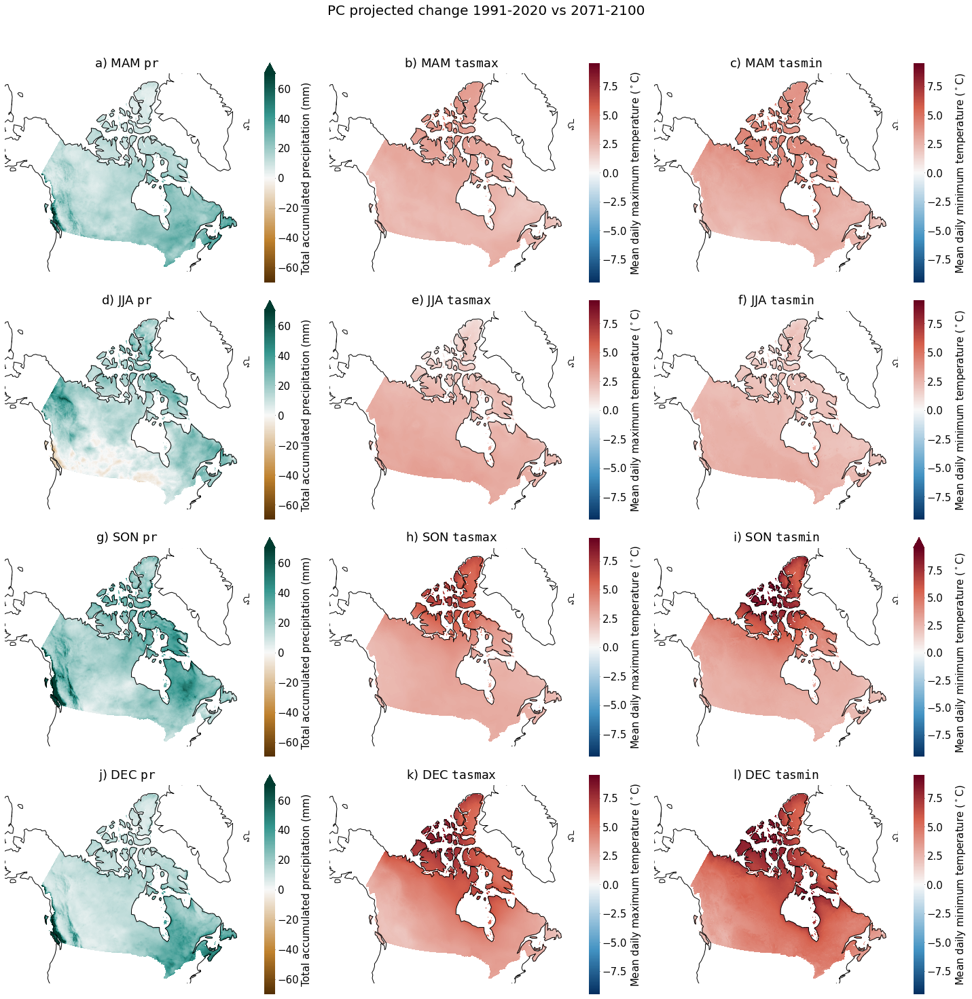

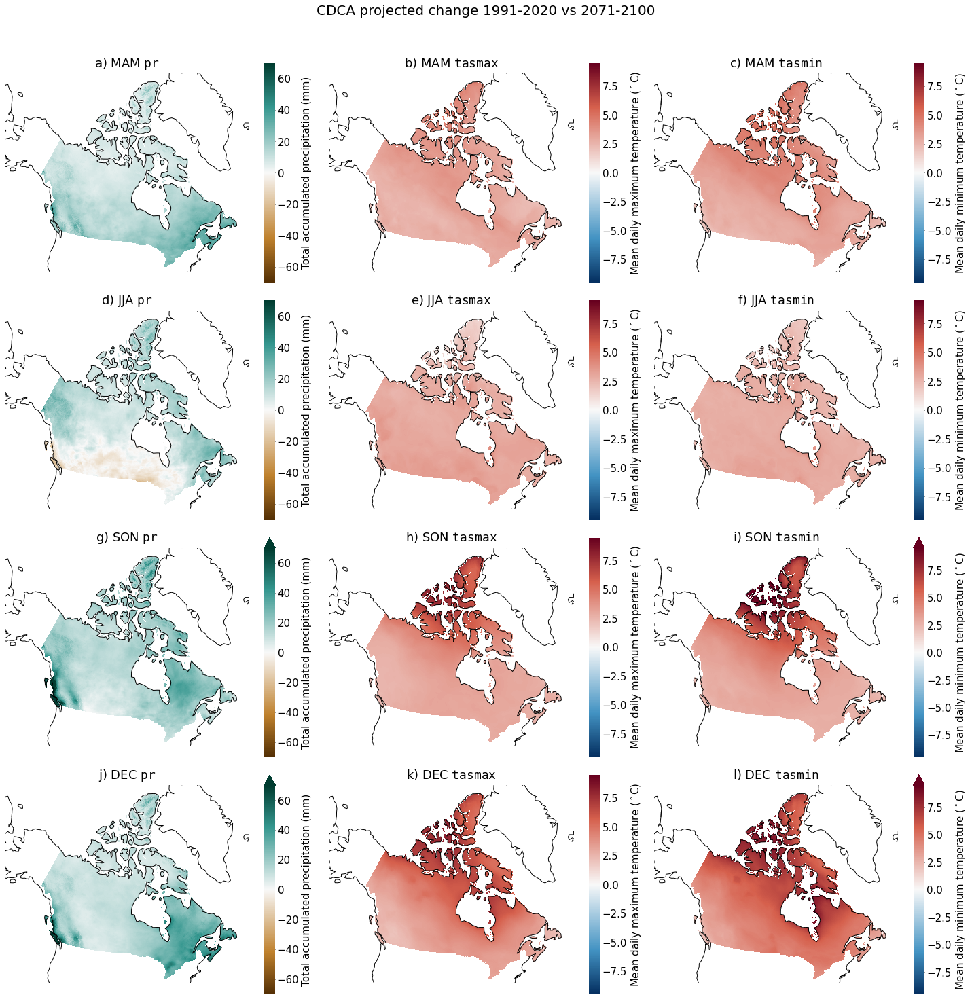

In [4]:
#*individual CD and PC delta seasonal
horizon= '2071-2100'
year = horizon.split('-')[0]
map_proj = ccrs.LambertConformal(central_longitude=-95, central_latitude=45)
fig1,axs1 = plt.subplots(4,3, figsize=(20,20),subplot_kw={"projection": map_proj})
fig2,axs2 = plt.subplots(4,3, figsize=(20,20),subplot_kw={"projection": map_proj})

for j,var in enumerate(['prcptot', 'tx_mean', 'tn_mean']):
    for xrfreq in ['QS-DEC']:
        
        variables= [f"{var}_delta_1991_2020_{p}" for p in ['p10','p50','p90']]
        
        level =  'ensemble-30ymean'
        
        #pcic ensemble
        ens_pcic = pcat.search(xrfreq=xrfreq,
                               variable=variables,
                               bias_adjust_project='climatedata',
                               processing_level=level,
                               domain='CAN-PCIC',
                               experiment='ssp245').to_dask(**tdd)
        ens_pcic = ens_pcic.sel(time=year)
        
        #espo ensemble
        level =  'ensemble-abs-delta-1991-2020'
        ens_espo = pcat.search(xrfreq=xrfreq,
                               variable=variables,
                               bias_adjust_project='ESPO-G6-R2',
                               processing_level=level,
                               domain='CAN-PCIC',
                               experiment='ssp245').to_dask(**tdd)
        ens_espo = ens_espo.sel(time=year)
        
            
        #selection
        cur_pcic = ens_pcic[f'{var}_delta_1991_2020_p50']
        cur_espo = ens_espo[f'{var}_delta_1991_2020_p50']
        
        cur_pcic.attrs['history']=cur_espo.attrs['history']

            
        if var =='prcptot':
            plot_kw={'vmin':-70, 'vmax':70}
        else:
            plot_kw={'vmin':-9.5, 'vmax':9.5}
            cur_espo.attrs['units']= "$^\circ$C"
            cur_pcic.attrs['units']= "$^\circ$C"

        for i,(time,season) in enumerate(zip(['2071-03-01', '2071-06-01','2071-09-01', '2071-12-01'],
                                            ['MAM','JJA','SON','DEC'])):
            sp.gridmap(cur_espo.sel(time=time).squeeze(), ax=axs1[i,j], divergent=0, features=['coastline'], plot_kw=plot_kw)
            axs1[i,j].set_title(f'{string.ascii_lowercase[j+(3*i)]}) {season} {var2name[var]}', fontsize=18)
            axs1[i,j].collections[-1].colorbar.outline.set_visible(False)
            axs1[i,j].collections[-1].colorbar.set_label(
                f"{cur_espo.attrs['long_name'].split(':')[0]} ({cur_espo.attrs['units']})".replace('30-year mean of ',''),
                fontsize=15)
            axs1[i,j].collections[-1].colorbar.ax.tick_params(labelsize=15)
            fig1.suptitle(f'PC projected change 1991-2020 vs {horizon}', fontsize=20, y=1.02)

            
            sp.gridmap(cur_pcic.sel(time=time).squeeze(), ax=axs2[i,j], divergent=0, features=['coastline'], plot_kw=plot_kw)
            axs2[i,j].set_title(f'{string.ascii_lowercase[j+(3*i)]}) {season} {var2name[var]}', fontsize=18)
            axs2[i,j].collections[-1].colorbar.outline.set_visible(False)
            axs2[i,j].collections[-1].colorbar.set_label(
                f"{cur_espo.attrs['long_name'].split(':')[0]} ({cur_espo.attrs['units']})".replace('30-year mean of ',''),
                fontsize=15)
            axs2[i,j].collections[-1].colorbar.ax.tick_params(labelsize=15)
            fig2.suptitle(f'CDCA projected change 1991-2020 vs {horizon}', fontsize=20, y=1.02)

        
fig1.tight_layout()
fig2.tight_layout()


#  Compare References

INFO:distributed.scheduler:State start
INFO:distributed.scheduler:  Scheduler at:     tcp://127.0.0.1:45530
INFO:distributed.scheduler:  dashboard at:            127.0.0.1:6786
INFO:distributed.nanny:        Start Nanny at: 'tcp://127.0.0.1:40240'
INFO:distributed.nanny:        Start Nanny at: 'tcp://127.0.0.1:44983'
INFO:distributed.scheduler:Register worker <WorkerState 'tcp://127.0.0.1:33166', name: 0, status: init, memory: 0, processing: 0>
INFO:distributed.scheduler:Starting worker compute stream, tcp://127.0.0.1:33166
INFO:distributed.core:Starting established connection to tcp://127.0.0.1:41722
INFO:distributed.scheduler:Register worker <WorkerState 'tcp://127.0.0.1:34368', name: 1, status: init, memory: 0, processing: 0>
INFO:distributed.scheduler:Starting worker compute stream, tcp://127.0.0.1:34368
INFO:distributed.core:Starting established connection to tcp://127.0.0.1:41716
INFO:distributed.scheduler:Receive client connection: Client-d91c901d-166b-11ee-91c8-0cc47a3a8380
INF

Removing /exec/jlavoie/tmp/diff.zarr/tx_mean to overwrite.
Removing /exec/jlavoie/tmp/diff.zarr/tn_mean to overwrite.
Removing /exec/jlavoie/tmp/diff.zarr/prcptot to overwrite.


INFO:distributed.core:Event loop was unresponsive in Scheduler for 3.14s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
INFO:distributed.core:Event loop was unresponsive in Nanny for 3.16s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
INFO:distributed.core:Event loop was unresponsive in Nanny for 3.20s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
INFO:distributed.core:Event loop was unresponsive in Scheduler for 10.26s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
INFO:distributed.core:Event loop was unresponsive in Nanny for 10.26s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause t

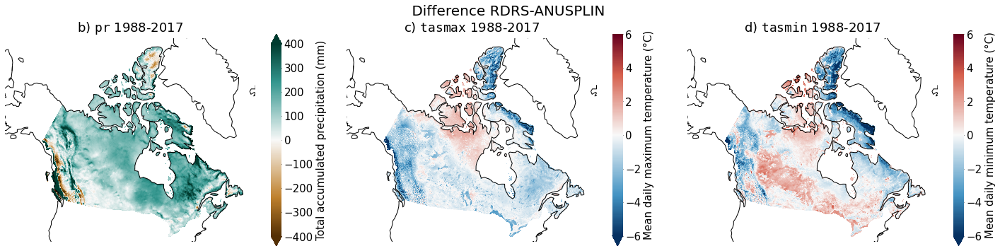

In [38]:
with Client(n_workers=2, threads_per_worker=2,dashboard_address= 6786, memory_limit="30GB",local_directory= CONFIG['paths']['local_directory'] ):

    fig,axs = plt.subplots(1,3, figsize=(20,5),subplot_kw={"projection": map_proj})
    
    period=["1988","2017"]
    horizon='-'.join(period)
    sources={}
    for source in ['NRCAN','RDRS']:
        ds = pcat_ref.search(source=source,variable=['tasmax', 'tasmin', 'pr'],
                             xrfreq='D',).to_dataset(**tdd).sel(time=slice(*map(str, period)))
        _, ds_ind = xs.compute_indicators(
            ds=ds,
            indicators="basic_var.yml",
        ).popitem()

        ds_mean = xs.climatological_mean(
            ds=ds_ind, window=30
        )
        
        #regrid on NRCAN
        if source=='RDRS':
            mask_args = {
                    "variable": 'tx_mean',
                    "where_operator": "<",
                    "where_threshold": 100000000,
                    "mask_nans": True
                }
            sources['NRCAN']["mask"] = xs.create_mask(sources['NRCAN'], mask_args=mask_args)
            ds_mean["mask"] = xs.create_mask(ds_mean, mask_args=mask_args)

            
            ds_mean = xs.regrid_dataset(
                            ds=ds_mean.chunk({'rlat':-1, 'rlon':-1}),
                            weights_location=CONFIG['paths']['weights_location'],
                            ds_grid=sources['NRCAN'],
                            regridder_kwargs={"extrap_method": "inverse_dist"},
                            )
        ds_mean['tx_mean']=xc.units.convert_units_to(ds_mean['tx_mean'], 'degC')
        ds_mean['tn_mean']=xc.units.convert_units_to(ds_mean['tn_mean'], 'degC')
        sources[source]=ds_mean
        

    diff = sources['RDRS']-sources['NRCAN']
    xs.save_to_zarr(diff, '/exec/jlavoie/tmp/diff.zarr', mode='o')

    for i,var in enumerate(['prcptot', 'tx_mean', 'tn_mean']): 
        diff[var].attrs = sources['RDRS'][var].attrs
        
        if var =='prcptot':
            plot_kw={'vmin':-400, 'vmax':400}
        else:
            plot_kw={'vmin':-6, 'vmax':6}
        
        sp.gridmap(diff[var].squeeze(), ax=axs[i], divergent=0, features=['coastline'], plot_kw=plot_kw)

        axs[i].set_title(f'{string.ascii_lowercase[i+1]}) {var2name[var]} {horizon}', fontsize=18)
        axs[i].collections[-1].colorbar.outline.set_visible(False)
        axs[i].collections[-1].colorbar.set_label(
            f"{diff[var].attrs['long_name']} ({diff[var].attrs['units']})".replace('30-year mean of ',''),
            fontsize=15)
        axs[i].collections[-1].colorbar.ax.tick_params(labelsize=15)

    fig.suptitle(f' Difference RDRS-ANUSPLIN', fontsize=20)
    fig.tight_layout()


# CMIP5

Moderate Emissions
prcptot [38.57466428]
tx_mean [-0.17148098]
tn_mean [-0.19309282]
prcptot [27.63411947]
tx_mean [-0.83870647]
tn_mean [-0.91919807]
High Emissions
prcptot [28.6638164]
tx_mean [-0.82437158]
tn_mean [-0.76441446]


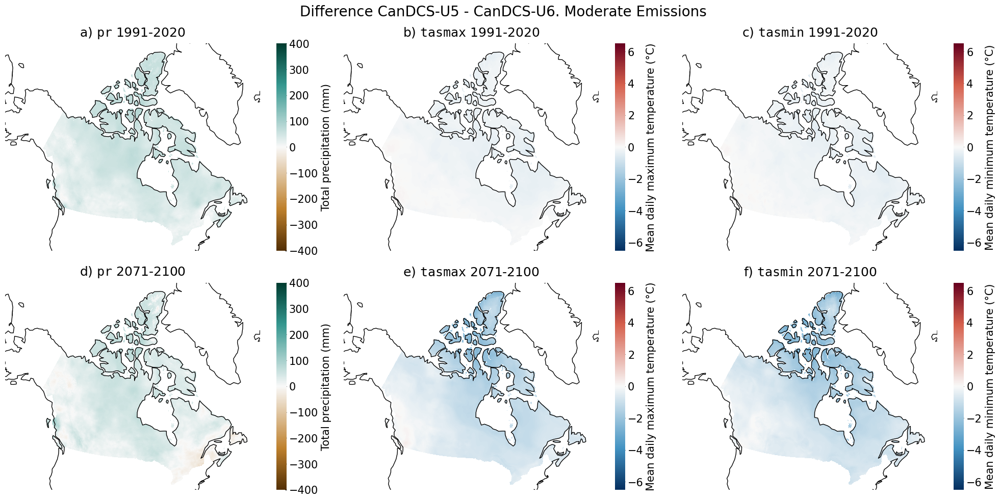

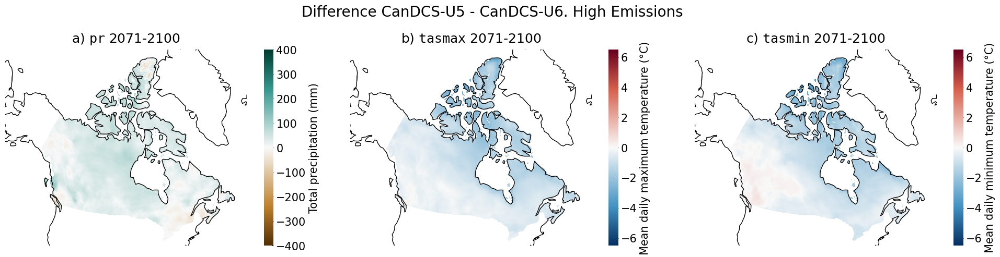

In [4]:
#*diff 5 and 6 climatology
# xscen-dev env
for exp_pcic, exp_5, exp_title in zip(['ssp245','ssp585'],['rcp45','rcp85'],
                                         ['Moderate Emissions','High Emissions']):
    print(exp_title)
    
    fig,axs = plt.subplots(2 if exp_title == 'Moderate Emissions' else 1,
                           3,
                           figsize=(20,10) if exp_title == 'Moderate Emissions' else (20,5),
                           subplot_kw={"projection": map_proj})

    horizons=['1991-2020','2071-2100'] if exp_title == 'Moderate Emissions' else ['2071-2100']
    for j,horizon in enumerate(horizons):
        year = horizon.split('-')[0]
        for i,var in enumerate(['prcptot', 'tx_mean', 'tn_mean']):

            for xrfreq in ['AS-JAN']:

                variables= [f"{var}_{p}" for p in ['p10','p50','p90']]



                
                ens_pcic=xr.open_dataset(pcat.search(xrfreq=xrfreq,
                                       variable=variables,
                                       bias_adjust_project='climatedata',
                                       processing_level='ensemble-30ymean',
                                       domain='CAN-PCIC',
                                       experiment=exp_pcic).df.path[0], decode_timedelta=False).sel(time=year)
                
                #display(ens_pcic)
                #cmip5 ensemble
                
                ens_5= xr.open_dataset(f'https://pavics.ouranos.ca/twitcher/ows/proxy/thredds/dodsC/birdhouse/disk2/cccs_portal/indices/Final/BCCAQv2/{var}/allrcps_ensemble_stats/YS/30yAvg_BCCAQv2+ANUSPLIN300_ensemble-percentiles_historical+allrcps_1951-2100_{var}_YS.nc')
                cur_5=ens_5[f'{exp_5}_{var}_p50'].sel(time=year)
                #display(cur_5)

                #selection
                cur_pcic = ens_pcic[f'{var}_p50']



                with xr.set_options(keep_attrs=True):
                    if var =='prcptot':
                        diff = cur_5 - cur_pcic
                        plot_kw={'vmin':-400, 'vmax':400}
                        diff.attrs['history']='pr'# for cmap
                    else:
                        cur_5= xc.units.convert_units_to(cur_5, 'degC')
                        cur_pcic= xc.units.convert_units_to(cur_pcic, 'degC')
                        diff = (cur_5 - cur_pcic)
                        plot_kw={'vmin':-6.5, 'vmax':6.5}
                        diff.attrs['history']=var# for cmap

                #print(var, diff.max().values, diff.min().values, diff.mean().values, diff.std().values)
                #print(var, xs.spatial_mean(diff, method='cos-lat').values)

                
                ax=axs[j,i] if exp_title == 'Moderate Emissions' else axs[i]
                
                
                sp.gridmap(diff.squeeze(), ax=ax, divergent=0, features=['coastline'], plot_kw=plot_kw)

                ax.set_title(f'{string.ascii_lowercase[i+(3*j)]}) {var2name[var]} {horizon}', fontsize=18)
                ax.collections[-1].colorbar.outline.set_visible(False)
                ax.collections[-1].colorbar.set_label(
                    f"{diff.attrs['long_name']} ({diff.attrs['units']})".replace('30-year mean of ',''), fontsize=15)
                ax.collections[-1].colorbar.ax.tick_params(labelsize=15)


            fig.tight_layout()
            fig.suptitle(f' Difference CanDCS-U5 - CanDCS-U6. {exp_title}', fontsize=20)


portals
Moderate Emissions
prcptot [162.45456266]
tx_mean [-0.75733771]
tn_mean [-0.19465658]
prcptot [172.51313852]
tx_mean [-1.14689224]
tn_mean [-0.53120684]
High Emissions
prcptot [156.37420718]
tx_mean [-2.63103204]
tn_mean [-1.96126279]

prcptot [-11.14356324]


/exec/jlavoie/.conda/xscen-dev/lib/python3.11/site-packages/figanos/matplotlib/utils.py:155: UserWarning: Attribute "description" not found.


tx_mean [-0.66585726]


/exec/jlavoie/.conda/xscen-dev/lib/python3.11/site-packages/figanos/matplotlib/utils.py:155: UserWarning: Attribute "description" not found.


tn_mean [-0.73917394]


/exec/jlavoie/.conda/xscen-dev/lib/python3.11/site-packages/figanos/matplotlib/utils.py:155: UserWarning: Attribute "description" not found.


prcptot [-11.60932236]


/exec/jlavoie/.conda/xscen-dev/lib/python3.11/site-packages/figanos/matplotlib/utils.py:155: UserWarning: Attribute "description" not found.


tx_mean [-0.67601458]


/exec/jlavoie/.conda/xscen-dev/lib/python3.11/site-packages/figanos/matplotlib/utils.py:155: UserWarning: Attribute "description" not found.


tn_mean [-0.64518673]


/exec/jlavoie/.conda/xscen-dev/lib/python3.11/site-packages/figanos/matplotlib/utils.py:155: UserWarning: Attribute "description" not found.


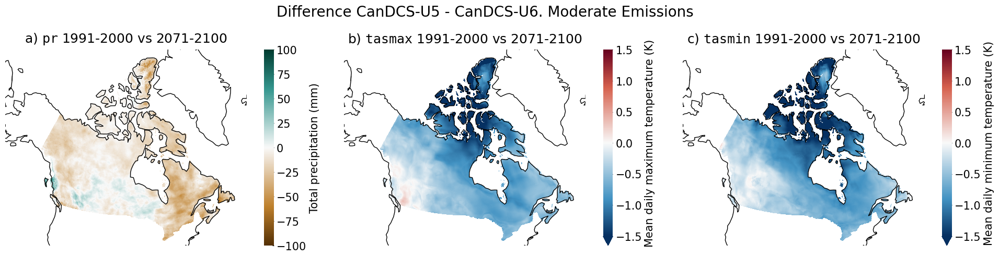

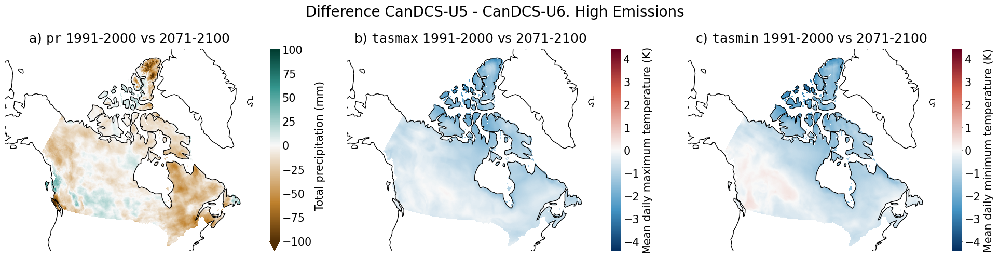

In [7]:
#*diff CD and PC delta
horizon= '2071-2100'
year = horizon.split('-')[0]
for exp_pcic, exp_5, exp_title in zip(['ssp245','ssp585'],['rcp45','rcp85'],
                                         ['Moderate Emissions','High Emissions']):
    fig,axs = plt.subplots(1,3, figsize=(20,5),subplot_kw={"projection": map_proj})
    for i,var in enumerate(['prcptot', 'tx_mean', 'tn_mean']):
        for xrfreq in ['AS-JAN']:

            variables= [f"{var}_delta_1991_2020_{p}" for p in ['p10','p50','p90']]

            level =  'ensemble-30ymean'
            #pcic ensemble
            ens_pcic = pcat.search(xrfreq=xrfreq,
                                   variable=variables,
                                   bias_adjust_project='climatedata',
                                   processing_level=level,
                                   domain='CAN-PCIC',
                                   experiment=exp_pcic).to_dask(**tdd).sel(time=year)

            #espo ensemble
            level =  'ensemble-abs-delta-1991-2020'
            ens_5= xr.open_dataset(f'https://pavics.ouranos.ca/twitcher/ows/proxy/thredds/dodsC/birdhouse/disk2/cccs_portal/indices/Final/BCCAQv2/{var}/allrcps_ensemble_stats/YS/30yAvg_BCCAQv2+ANUSPLIN300_ensemble-percentiles_historical+allrcps_1951-2100_{var}_YS.nc')
            cur_5=((ens_5[f'{exp_5}_{var}_p50'].sel(time=year)).squeeze()-(ens_5[f'{exp_5}_{var}_p50'].sel(time='1991')).squeeze())#.squeeze()


            #selection
            cur_pcic = ens_pcic[f'{var}_delta_1991_2020_p50']
            
            #difference
            with xr.set_options(keep_attrs=True):
                diff = (cur_5 - cur_pcic)
                diff.attrs['long_name']=ens_5[f'{exp_5}_{var}_p50'].attrs['long_name']
                diff.attrs['units']=ens_5[f'{exp_5}_{var}_p50'].attrs['units']
                diff.attrs['history']=var.replace('prcptot','pr')
            
            #print(var, diff.max().values, diff.min().values, diff.mean().values, diff.std().values)
            #print(var, xs.spatial_mean(diff, method='cos-lat').values)

                
            if var =='prcptot':
                plot_kw= {'vmax':100,'vmin':-100}
            elif exp_5=='rcp45':
                plot_kw= {'vmax':1.5,'vmin':-1.5}
            else:
                plot_kw= {'vmax':4.4,'vmin':-4.4}
            
            #plot
            sp.gridmap(diff.squeeze(), ax=axs[i], divergent=0, features=['coastline'],plot_kw=plot_kw)
            fig.suptitle(f' Difference CanDCS-U5 - CanDCS-U6. {exp_title}', fontsize=20)
            axs[i].set_title(f'{string.ascii_lowercase[i]}) {var2name[var]} 1991-2000 vs {horizon}', fontsize=18)
            axs[i].collections[-1].colorbar.outline.set_visible(False)
            axs[i].collections[-1].colorbar.set_label(
                f"{diff.attrs['long_name'].split(':')[0]} ({diff.attrs['units']})".replace('30-year mean of ',''),
                fontsize=15)
            axs[i].collections[-1].colorbar.ax.tick_params(labelsize=15)
            fig.tight_layout()


portals
Moderate Emissions
prcptot diff [11.21576851] P
tx_mean diff [-0.37568527] 5
tn_mean diff [-0.34510215] 5


High Emissions
prcptot diff [-6.76777279] 5
tx_mean diff [-1.84889695] P
tn_mean diff [-1.78559632] P


